In [1]:
%cd ../..

/mnt/batch/tasks/shared/LS_root/mounts/clusters/jeffrey-uso9-03-dev-ci01/code/Users/jeffrey.tackes/ModernTS_2E


In [2]:
import os
import shutil
import json

import joblib
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default = "plotly_white"

from pathlib import Path

from tqdm.autonotebook import tqdm
from IPython.display import display, HTML
# %load_ext autoreload
# %autoreload 2
np.random.seed(42)
tqdm.pandas()

from statsforecast import StatsForecast
from neuralforecast import NeuralForecast
from neuralforecast.models import TSMixer
from neuralforecast.auto import AutoTSMixer
from neuralforecast.losses.pytorch import MQLoss
from utilsforecast.evaluation import evaluate
from utilsforecast.losses import rmse, mae, mse, mase
from neuralforecast.losses.pytorch import MSE, MAE
from functools import partial

from ray import tune
from ray.tune.search.hyperopt import HyperOptSearch


import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("whitegrid")

/tmp/ipykernel_838999/3295486409.py:15: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm
2024-08-17 16:50:20,840	WARNING __init__.py:21 -- Package pickle5 becomes unnecessary in Python 3.8 and above. Its presence may confuse libraries including Ray. Please uninstall the package.
/anaconda/envs/demand_planning/lib/python3.10/site-packages/torch/cuda/__init__.py:619: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


In [3]:
TRAIN_SUBSAMPLE = True  # Trains a subsample of IDs to improve run speed
RETUNE = True  # if false, will use pre-trained hyperparameters when generating the AUTO NeuralForecast

In [4]:
preprocessed = Path("data/london_smart_meters/preprocessed")
output = Path("data/london_smart_meters/output")
try:
    #Reading the missing value imputed and train test split data
    train_df = pd.read_parquet(preprocessed/"selected_blocks_train_missing_imputed_feature_engg.parquet")
    # Read in the Validation dataset as test_df so that we predict on it
    test_df = pd.read_parquet(preprocessed/"selected_blocks_val_missing_imputed_feature_engg.parquet")
    # test_df = pd.read_parquet(preprocessed/"selected_blocks_test_missing_imputed_feature_engg.parquet")
except FileNotFoundError:
    display(HTML("""
    <div class="alert alert-block alert-warning">
    <b>Warning!</b> File not found. Please make sure you have run 01-Feature Engineering.ipynb in Chapter06
    </div>
    """))

In [5]:
train_df.head(2)

,timestamp,LCLid,energy_consumption,frequency,series_length,stdorToU,Acorn,Acorn_grouped,file,holidays,...,timestamp_Minute_sin_1,timestamp_Minute_sin_2,timestamp_Minute_sin_3,timestamp_Minute_sin_4,timestamp_Minute_sin_5,timestamp_Minute_cos_1,timestamp_Minute_cos_2,timestamp_Minute_cos_3,timestamp_Minute_cos_4,timestamp_Minute_cos_5
0,2012-01-01 00:00:00,MAC000061,0.114,30min,37872,Std,ACORN-Q,Adversity,block_96,NO_HOLIDAY,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.0,1.0,1.0,1.0,1.0
1,2012-01-01 00:30:00,MAC000061,0.113,30min,37872,Std,ACORN-Q,Adversity,block_96,NO_HOLIDAY,...,5.665539e-16,-1.133108e-15,2.143751e-15,-2.266215e-15,6.123234e-16,-1.0,1.0,-1.0,1.0,-1.0


In [6]:
print("Total # of IDs Pre-Sampling: ", len(train_df.LCLid.unique()))

Total # of IDs Pre-Sampling:  150


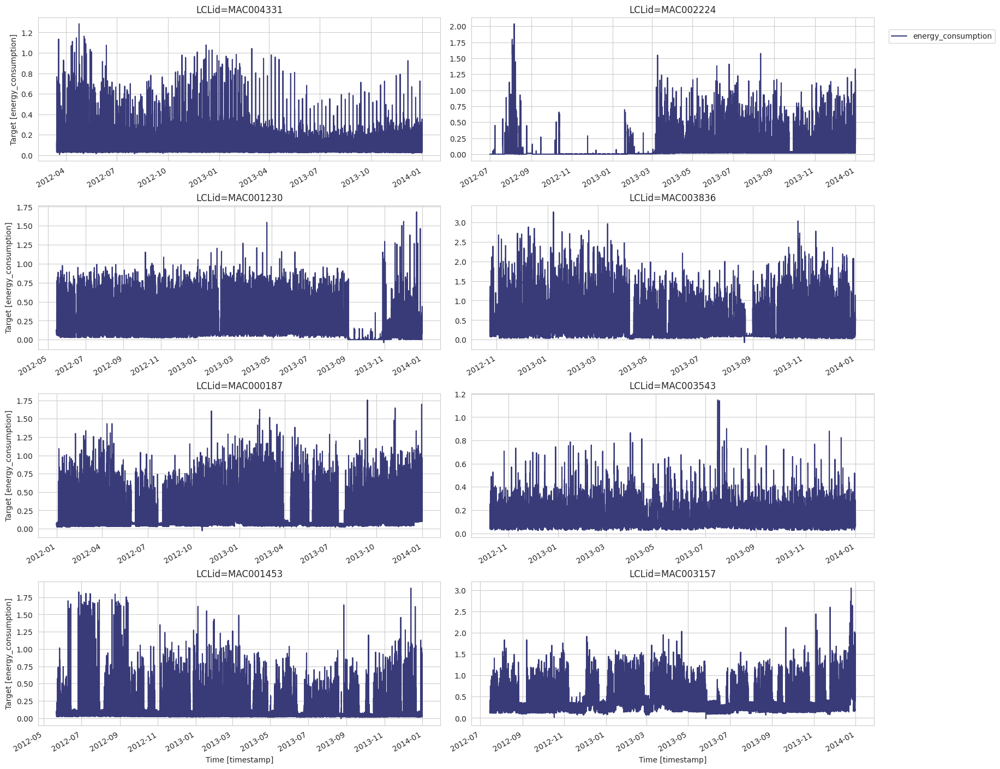

In [7]:
StatsForecast.plot(train_df, engine='matplotlib', id_col='LCLid',time_col= 'timestamp', target_col='energy_consumption')

In [8]:
# To run on smaller set of data for daster iteration.
if TRAIN_SUBSAMPLE:
    print("sub sampling")
    SAMPLE = 10
    sampled_LCLids = pd.Series(train_df.LCLid.unique().remove_unused_categories().categories).sample(SAMPLE, random_state=99).tolist()
    train_df = train_df.loc[train_df.LCLid.isin(sampled_LCLids)]
    test_df = test_df.loc[test_df.LCLid.isin(sampled_LCLids)]

sub sampling


In [9]:
print("Total # of IDs Post Sampling: ", len(train_df.LCLid.unique()))

Total # of IDs Post Sampling:  10


## Train, Validation, Test Set

In [10]:
print("Training Min Date: ", train_df.timestamp.min(), 
      "\nTraining Max Date: ", train_df.timestamp.max(), 
      "\nTesting Min Date: ", test_df.timestamp.min(),
      "\nTesting Max Date: ", test_df.timestamp.max()
)

Training Min Date:  2012-01-01 00:00:00 
Training Max Date:  2013-12-31 23:30:00 
Testing Min Date:  2014-01-01 00:00:00 
Testing Max Date:  2014-01-31 23:30:00


In [11]:
#Keeping 1 days aside as a validation set
cutoff = train_df.timestamp.max() - pd.Timedelta(1, "D")

validation_df = train_df[(train_df.timestamp>cutoff)].reset_index(drop=True) # validation prediction set
training_df = train_df[(train_df.timestamp<=cutoff)].reset_index(drop=True) # training set used for validation set

print(f"Train Max: {training_df.timestamp.max()} \nValidation Min: {validation_df.timestamp.min()} \nValidation Max: {validation_df.timestamp.max()}")
print(f"Validation Horizon: {len(validation_df.timestamp.unique())}")


Train Max: 2013-12-30 23:30:00 
Validation Min: 2013-12-31 00:00:00 
Validation Max: 2013-12-31 23:30:00
Validation Horizon: 48


##### Define Validation model parameters

In [12]:
h = 48
max_steps = 100

## Training TSMixer Model

In [13]:
training_df[['LCLid']].nunique()[0]

10

In [14]:
len(training_df['LCLid'].unique())

10

In [17]:
model_untuned = [TSMixer (h=h, input_size = 48*7, 
                max_steps = max_steps,
                n_series = len(training_df['LCLid'].unique()))]

model_untuned = NeuralForecast(models=model_untuned, freq='30min')
model_untuned.fit(training_df[['LCLid','timestamp','energy_consumption']], id_col = 'LCLid',time_col = 'timestamp',target_col='energy_consumption')

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name          | Type                     | Params
-----------------------------------------------------------
0 | loss          | MAE                      | 0     
1 | padder        | ConstantPad1d            | 0     
2 | scaler        | TemporalNorm             | 0     
3 | norm          | ReversibleInstanceNorm1d | 20    
4 | mixing_layers | Sequential               | 256 K 
5 | out           | Linear                   | 16.2 K
-----------------------------------------------------------
272 K     Trainable params
0         Non-trainable params
272 K     Total params
1.089     Total estimated model params size (MB)


Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_steps=100` reached.


In [18]:
# Get Predictions for validation
pred_df =  model_untuned.predict(futr_df=validation_df[['LCLid','timestamp','energy_consumption']]).reset_index()
pred_df = pred_df.merge(validation_df[['LCLid','timestamp','energy_consumption']], on=['LCLid','timestamp'], how='left')
pred_df.head()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |                                                                                                 …

/anaconda/envs/demand_planning/lib/python3.10/site-packages/neuralforecast/core.py:196: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


,LCLid,timestamp,TSMixer,energy_consumption
0,MAC000126,2013-12-31 00:00:00,0.126954,0.093
1,MAC000126,2013-12-31 00:30:00,0.108472,0.109
2,MAC000126,2013-12-31 01:00:00,0.089753,0.082
3,MAC000126,2013-12-31 01:30:00,0.068020,0.067
4,MAC000126,2013-12-31 02:00:00,0.064206,0.043


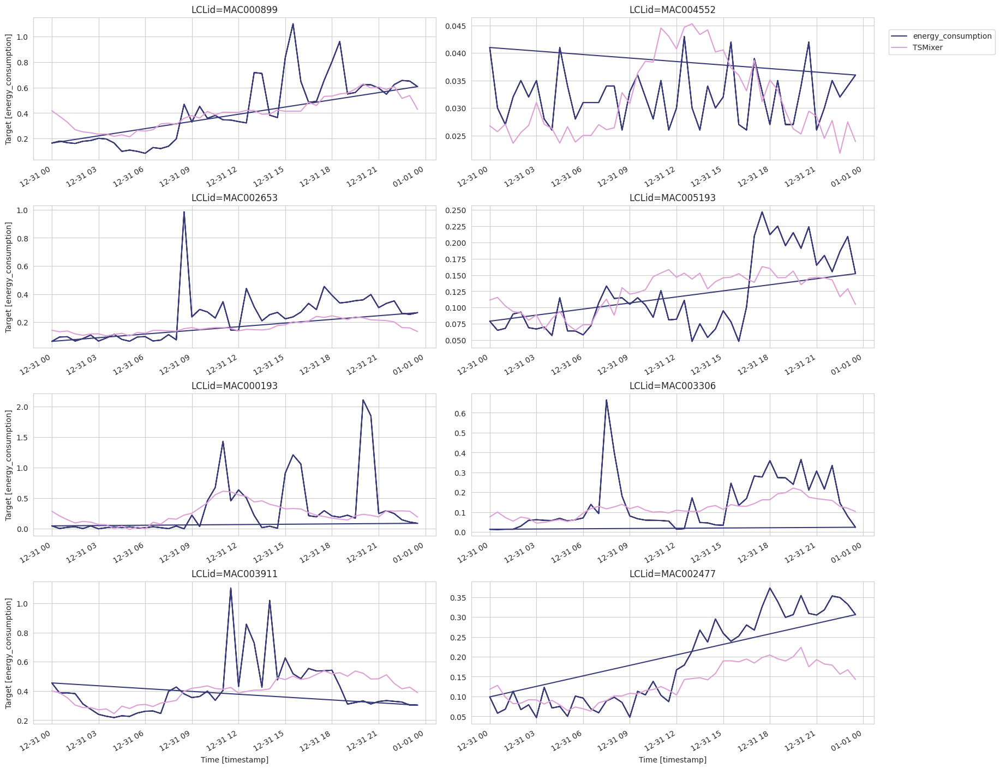

In [19]:
#visualize results
StatsForecast.plot(validation_df[['LCLid','timestamp','energy_consumption']], 
                   pred_df, engine='matplotlib', 
                   id_col='LCLid',
                   time_col= 'timestamp', 
                   target_col='energy_consumption',
                   models=['TSMixer'])

#### Evaluate TSMixer forecast

In [23]:
fcst_mase = partial(mase, seasonality=48)

# Get metrics for individual LCLid's
TSMixer_metrics = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption'
        )

# Get aggregated metrics for across all LCLid's by model
TSMixer_metrics_agg = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption',
        agg_fn='mean'
        )

In [24]:
TSMixer_metrics_agg

,metric,TSMixer
0,rmse,0.133567
1,mae,0.084367
2,mse,0.031655
3,mase,0.777935


## TSMixer Tuned
Since hyperparameters are key to performance in Neural Networks, NIXTLA has made this search each through the incorporation of Auto forecast.
Each NeuralForecast model has an AUTO class which allow you to easily tune your hyperparameters.

Auto Forecast can time, you can load the pre-trained hyperparameters or choose to retune on your own.
Set ```RETUNE = True``` if you wish to retune.


In [25]:
# Define the file path
config_file_path = 'notebooks/Chapter16/saved_params_config/TSMixer_best_config.json'
try:
    with open(config_file_path, 'r') as config_file:
        loaded_config = json.load(config_file)
        print(loaded_config)
except FileNotFoundError:
    display(HTML("""
    <div class="alert alert-block alert-warning">
    <b>Warning!</b> File not found. 
    </div>
    """))
    

In [28]:
TSMixer_config = {
    "max_steps": max_steps,  # This parameter can be adjusted if needed
    "input_size": tune.choice([h,h*7,h*7*2,h*7*3]), # Size of input window
    "learning_rate": tune.loguniform(1e-4, 1e-1),  # Initial learning rate
    "scaler_type": tune.choice(["minmax", "standard"]),
    "batch_size": tune.choice([32, 64,128, 256]),
    "random_seed": tune.choice([10, 20,30]),
}

if RETUNE == True:
    models = [AutoTSMixer(h=h, 
                     config = TSMixer_config,
                     search_alg = HyperOptSearch(),
                     backend = 'ray',
                     num_samples = 100,
                     #cpus=10,
                     loss=MSE(),
                     valid_loss=MAE(), 
                     n_series = len(training_df['LCLid'].unique()) 
                     )]

else:
    models = [AutoTSMixer(h=h, 
                    config = loaded_config,
                    search_alg = None,
                    backend = 'ray',
                    #cpus=1
                    )]


model_tuned = NeuralForecast(models=models, freq='30min')
model_tuned.fit(training_df[['LCLid','timestamp','energy_consumption']], id_col = 'LCLid',time_col = 'timestamp',target_col='energy_consumption',  val_size = 48)

(_train_tune pid=900359) /anaconda/envs/demand_planning/lib/python3.10/site-packages/ray/tune/integration/pytorch_lightning.py:194: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=900359) Seed set to 20
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_48ba0f66_1_batch_size=64,h=48,input_size=1008,learning_rate=0.0028,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_16-56-43/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -------------------

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 17:07:40,634	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 20


(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  0.14it/s, v_num=0, train_loss_step=0.0213, train_loss_epoch=0

(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_96c09b2b_2_batch_size=256,h=48,input_size=48,learning_rate=0.0015,loss=ref_ph_de895953,max_steps=100,n_series=10,rando_2024-08-17_16-56-50/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 17:17:07,878	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  0.13it/s, v_num=0, train_loss_step=0.909, train_loss_epoch

(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_d8a2e95a_3_batch_size=64,h=48,input_size=1008,learning_rate=0.0097,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_17-07-40/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 17:27:20,611	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  0.15it/s, v_num=0, train_loss_step=1.500, train_loss_epoch

(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_42ea6d0b_4_batch_size=64,h=48,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,n_series=10,rando_2024-08-17_17-17-07/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 17:37:27,550	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 30


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  0.14it/s, v_num=0, train_loss_step=1.650, train_loss_epoch

(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_b992f642_5_batch_size=128,h=48,input_size=1008,learning_rate=0.0210,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_17-27-20/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 17:49:08,160	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.11it/s, v_num=0, train_loss_step=11.20, train_loss_epoch

(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_16e713c7_6_batch_size=128,h=48,input_size=1008,learning_rate=0.0115,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_17-37-27/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:00:57,075	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  0.13it/s, v_num=0, train_loss_step=0.160, train_loss_epoch=

(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_42be051f_7_batch_size=128,h=48,input_size=672,learning_rate=0.0067,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_17-49-08/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:12:37,323	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.12it/s, v_num=0, train_loss_step=0.0661, train_loss_epoch=0

(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_67cfd4d6_8_batch_size=128,h=48,input_size=48,learning_rate=0.0009,loss=ref_ph_de895953,max_steps=100,n_series=10,rando_2024-08-17_18-00-57/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:22:44,562	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  0.15it/s, v_num=0, train_loss_step=71.00, train_loss_epoch

(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_ae65a94c_9_batch_size=64,h=48,input_size=1008,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_18-12-37/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:32:57,499	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  0.15it/s, v_num=0, train_loss_step=0.0781, train_loss_epoch=0

(_train_tune pid=900359) Seed set to 20
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_36fd5583_10_batch_size=128,h=48,input_size=336,learning_rate=0.0005,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_18-22-44/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:44:18,317	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.11it/s, v_num=0, train_loss_step=55.00, train_loss_epoch

(_train_tune pid=900359) Seed set to 20
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_93e449c8_11_batch_size=32,h=48,input_size=672,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_18-32-57/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 18:53:14,688	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  0.16it/s, v_num=0, train_loss_step=0.0324, train_loss_epoch=0

(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_737511bc_12_batch_size=32,h=48,input_size=336,learning_rate=0.0030,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_18-44-18/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 19:01:46,905	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.18it/s, v_num=0, train_loss_step=0.862, train_loss_epoch=

(_train_tune pid=900359) Seed set to 20
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_f3a7cb18_13_batch_size=256,h=48,input_size=672,learning_rate=0.0341,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_18-53-14/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 19:13:00,694	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  0.13it/s, v_num=0, train_loss_step=12.20, train_loss_epoch

(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_9fd9894e_14_batch_size=256,h=48,input_size=48,learning_rate=0.0019,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_19-01-46/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 19:23:20,289	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  0.13it/s, v_num=0, train_loss_step=49.90, train_loss_epoch

(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_70892094_15_batch_size=256,h=48,input_size=1008,learning_rate=0.0203,loss=ref_ph_de895953,max_steps=100,n_series=10,ra_2024-08-17_19-13-00/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 19:35:54,079	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.11it/s, v_num=0, train_loss_step=5.920, train_loss_epoch

(_train_tune pid=900359) Seed set to 20
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_aa22d9d8_16_batch_size=32,h=48,input_size=336,learning_rate=0.0940,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_19-23-20/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 19:45:14,218	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  0.15it/s, v_num=0, train_loss_step=24.40, train_loss_epoch

(_train_tune pid=900359) Seed set to 20
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_fa1d0397_17_batch_size=64,h=48,input_size=48,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,n_series=10,rando_2024-08-17_19-35-54/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 19:52:19,594	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.18it/s, v_num=0, train_loss_step=47.10, train_loss_epoch

(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_bea91bef_18_batch_size=128,h=48,input_size=672,learning_rate=0.0368,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_19-45-14/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 20:03:51,756	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  0.12it/s, v_num=0, train_loss_step=6.770, train_loss_epoch

(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_86251c1e_19_batch_size=128,h=48,input_size=48,learning_rate=0.0041,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_19-52-19/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 20:14:03,759	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  0.14it/s, v_num=0, train_loss_step=70.20, train_loss_epoch

(_train_tune pid=900359) Seed set to 20
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_0199438c_20_batch_size=256,h=48,input_size=48,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_20-03-51/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 20:23:58,206	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  0.15it/s, v_num=0, train_loss_step=18.60, train_loss_epoch

(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_a57ae4a7_21_batch_size=64,h=48,input_size=672,learning_rate=0.0061,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_20-14-03/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 20:32:56,442	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  0.15it/s, v_num=0, train_loss_step=0.0185, train_loss_epoch=0

(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_c04db949_22_batch_size=64,h=48,input_size=672,learning_rate=0.0011,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_20-23-58/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 20:41:07,117	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 30


(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.18it/s, v_num=0, train_loss_step=0.0171, train_loss_epoch=0

(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_108ec7b3_23_batch_size=128,h=48,input_size=672,learning_rate=0.0055,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_20-32-56/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 20:51:01,133	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  0.15it/s, v_num=0, train_loss_step=0.0656, train_loss_epoch=0.0656, valid_loss=0.0699]


(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_9decaee2_24_batch_size=64,h=48,input_size=672,learning_rate=0.0011,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_20-41-07/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 20:59:30,659	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.18it/s, v_num=0, train_loss_step=0.0172, train_loss_epoch=0

(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_29bea053_25_batch_size=32,h=48,input_size=672,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_20-51-01/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 21:07:41,814	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.17it/s, v_num=0, train_loss_step=0.073, train_loss_epoch=

(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_0bd8acf5_26_batch_size=64,h=48,input_size=672,learning_rate=0.0008,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_20-59-30/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 21:16:30,475	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 30


(_train_tune pid=900359) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  0.15it/s, v_num=0, train_loss_step=0.0177, train_loss_epoch=

(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_3cb3495e_27_batch_size=64,h=48,input_size=672,learning_rate=0.0008,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_21-07-41/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 21:25:14,014	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_675b9d8d_28_batch_size=64,h=48,input_size=672,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_21-16-30/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.19it/s, v_num=0, train_loss_step=0.0177, train_loss_epoch=0

2024-08-17 21:33:38,134	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 30


(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.19it/s, v_num=0, train_loss_step=0.0509, train_loss_epoch=0

(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_49ed6948_29_batch_size=64,h=48,input_size=672,learning_rate=0.0019,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_21-25-14/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 21:41:30,499	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_d2def8a3_30_batch_size=64,h=48,input_size=336,learning_rate=0.0011,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_21-33-38/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.20it/s, v_num=0, train_loss_step=0.0175, train_loss_epoch=0

2024-08-17 21:49:37,270	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_a89409c8_31_batch_size=64,h=48,input_size=672,learning_rate=0.0021,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_21-41-30/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.22it/s, v_num=0, train_loss_step=0.873, train_loss_epoch=

(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.2024-08-17 21:58:14,975	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}



Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  0.15it/s, v_num=0, train_loss_step=0.0178, train_loss_epoch=0.0178, valid_loss=0.0668]


(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_dc6203d2_32_batch_size=64,h=48,input_size=672,learning_rate=0.0025,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_21-49-37/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 22:07:26,199	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  0.13it/s, v_num=0, train_loss_step=0.0182, train_loss_epoch=0

(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_bbb338c1_33_batch_size=64,h=48,input_size=672,learning_rate=0.0018,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_21-58-15/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 22:16:35,697	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  0.13it/s, v_num=0, train_loss_step=0.0174, train_loss_epoch=0

(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_dd5870c3_34_batch_size=64,h=48,input_size=336,learning_rate=0.0123,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_22-07-26/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 22:24:51,388	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  0.14it/s, v_num=0, train_loss_step=0.869, train_loss_epoch

(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_9e656183_35_batch_size=64,h=48,input_size=1008,learning_rate=0.0006,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_22-16-35/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 22:33:13,806	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.18it/s, v_num=0, train_loss_step=0.0675, train_loss_epoch=0

(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_3f596eb8_36_batch_size=64,h=48,input_size=672,learning_rate=0.0036,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_22-24-51/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 22:40:56,250	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_ad3c7ed2_37_batch_size=32,h=48,input_size=672,learning_rate=0.0023,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_22-33-13/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.22it/s, v_num=0, train_loss_step=0.0192, train_loss_epoch=0

2024-08-17 22:46:43,193	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.24it/s, v_num=0, train_loss_step=0.0235, train_loss_epoch=

(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_9facb707_38_batch_size=256,h=48,input_size=1008,learning_rate=0.0970,loss=ref_ph_de895953,max_steps=100,n_series=10,ra_2024-08-17_22-40-56/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 22:54:51,242	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.18it/s, v_num=0, train_loss_step=0.272, train_loss_epoch

(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_a28d9dd8_39_batch_size=64,h=48,input_size=672,learning_rate=0.0098,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_22-46-43/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:01:14,003	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_514d66eb_40_batch_size=64,h=48,input_size=48,learning_rate=0.0015,loss=ref_ph_de895953,max_steps=100,n_series=10,rando_2024-08-17_22-54-51/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.22it/s, v_num=0, train_loss_step=0.0171, train_loss_epoch=0

2024-08-17 23:02:18,291	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 20
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_b47e8da0_41_batch_size=64,h=48,input_size=1008,learning_rate=0.0167,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-01-14/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13.17it/s, v_num=0, train_loss_step=9.560, train_loss_epoch

2024-08-17 23:05:57,059	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.26it/s, v_num=0, train_loss_step=0.0239, train_loss_epoch=

(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_f1a94d6e_42_batch_size=32,h=48,input_size=336,learning_rate=0.0006,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_23-02-18/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:11:50,844	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10


(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.25it/s, v_num=0, train_loss_step=0.0356, train_loss_epoch=0

(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_233f5a5a_43_batch_size=256,h=48,input_size=672,learning_rate=0.0047,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-05-57/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:19:04,301	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_39c7bcf2_44_batch_size=64,h=48,input_size=672,learning_rate=0.0364,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_23-11-50/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.19it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=

(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
(_train_tune pid=900359)

2024-08-17 23:25:09,835	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.21it/s, v_num=0, train_loss_step=0.0229, train_loss_epoch=0.0229, valid_loss=0.0999]


(_train_tune pid=900359) Seed set to 20
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_cb8e0041_45_batch_size=128,h=48,input_size=1008,learning_rate=0.0072,loss=ref_ph_de895953,max_steps=100,n_series=10,ra_2024-08-17_23-19-04/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:32:31,634	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_fb0fb308_46_batch_size=32,h=48,input_size=336,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_23-25-09/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.19it/s, v_num=0, train_loss_step=0.0306, train_loss_epoch=0

2024-08-17 23:37:58,094	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_e7c484b2_47_batch_size=64,h=48,input_size=48,learning_rate=0.0583,loss=ref_ph_de895953,max_steps=100,n_series=10,rando_2024-08-17_23-32-31/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.24it/s, v_num=0, train_loss_step=0.0644, train_loss_epoch=

2024-08-17 23:39:11,290	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Validation DataLoader 0: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 121.27it/s]


(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.74it/s, v_num=0, train_loss_step=9.510, train_loss_epoch

(_train_tune pid=900359) Seed set to 20
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_e9870849_48_batch_size=256,h=48,input_size=672,learning_rate=0.0014,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-37-58/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:42:28,382	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 30


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.17it/s, v_num=0, train_loss_step=12.20, train_loss_epoch

(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_2b5b9b07_49_batch_size=128,h=48,input_size=672,learning_rate=0.0030,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-39-11/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.184, train_loss_epoch=0.184]


2024-08-17 23:43:05,360	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 30


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.92it/s, v_num=0, train_loss_step=0.0662, train_loss_epoch=0.184]


(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_8720b4b4_50_batch_size=64,h=48,input_size=48,learning_rate=0.0082,loss=ref_ph_de895953,max_steps=100,n_series=10,rando_2024-08-17_23-42-28/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:43:10,033	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_01cde41c_51_batch_size=32,h=48,input_size=1008,learning_rate=0.0136,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-43-05/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s, v_num=0, train_loss_step=0.0128,

2024-08-17 23:43:33,437	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 20
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_d52e722a_52_batch_size=256,h=48,input_size=336,learning_rate=0.0268,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-43-10/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.67it/s, v_num=0, train_loss_step=0.0128, train_loss_epoch=0

2024-08-17 23:43:52,116	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_de106863_53_batch_size=64,h=48,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_23-43-33/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.53it/s, v_num=0, train_loss_step=40.90, train_loss_epoch

2024-08-17 23:44:12,284	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 30


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  7.64it/s, v_num=0, train_loss_step=0.0246, train_loss_epoch=0.045]


(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_99c74f5c_54_batch_size=128,h=48,input_size=672,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-43-52/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:44:42,643	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.30it/s, v_num=0, train_loss_step=0.102, train_loss_epoch=0.220]


(_train_tune pid=900359) Seed set to 20
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_b17f8740_55_batch_size=64,h=48,input_size=48,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,n_series=10,rando_2024-08-17_23-44-12/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:44:46,921	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_3a8300ee_56_batch_size=64,h=48,input_size=672,learning_rate=0.0054,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_23-44-42/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23.26it/s, v_num=0, train_loss_step=47.10, train_loss_epoch=42.50]


2024-08-17 23:45:18,087	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_2d501f62_57_batch_size=256,h=48,input_size=672,learning_rate=0.0021,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-44-46/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.55it/s, v_num=0, train_loss_step=0.0194, train_loss_epoch=0

2024-08-17 23:46:19,161	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 30
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_35d55611_58_batch_size=32,h=48,input_size=336,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_23-45-18/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.61it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=0.0223]


2024-08-17 23:46:35,181	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_268df5d5_59_batch_size=256,h=48,input_size=1008,learning_rate=0.0501,loss=ref_ph_de895953,max_steps=100,n_series=10,ra_2024-08-17_23-46-19/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.45it/s, v_num=0, train_loss_step=3.800, train_loss_epoch

2024-08-17 23:48:02,453	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Validation DataLoader 0: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18.97it/s]


(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.41it/s, v_num=0, train_loss_step=0.0483, train_loss_epoch=

(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_1d395861_60_batch_size=256,h=48,input_size=672,learning_rate=0.0006,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-46-35/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:48:52,289	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_8aa19075_61_batch_size=256,h=48,input_size=48,learning_rate=0.0037,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-17_23-48-02/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.69it/s, v_num=0, train_loss_step=0.115, train_loss_epoch=0.0224]


2024-08-17 23:48:57,937	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21.03it/s, v_num=0, train_loss_step=49.80, train_loss_epoch=124.0]


(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_127e5466_62_batch_size=256,h=48,input_size=672,learning_rate=0.0023,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-48-52/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:50:04,922	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.52it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=

(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_1edf6a9c_63_batch_size=256,h=48,input_size=672,learning_rate=0.0008,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-48-57/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.69it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=0.0217]

2024-08-17 23:50:58,842	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}



Validation: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    | 0/? [00:00<?, ?it/s]

(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_f4168a67_64_batch_size=256,h=48,input_size=672,learning_rate=0.0027,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-50-04/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:51:49,998	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_86845281_65_batch_size=256,h=48,input_size=336,learning_rate=0.0013,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-50-58/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.03it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=0.0227]


2024-08-17 23:52:08,721	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  8.38it/s, v_num=0, train_loss_step=20.20, train_loss_epoch=26.20]


(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_635ba752_66_batch_size=256,h=48,input_size=672,learning_rate=0.0029,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-51-50/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:53:08,506	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_0e7ebcc1_67_batch_size=256,h=48,input_size=672,learning_rate=0.0082,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-52-08/lightning_logs


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.17it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=0.0227]


(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | TemporalNorm             | 0     
(_train_tune pid=900359) 4 | norm          | ReversibleInstanceNorm1d | 20    
(_train_tune pid=900359) 5 | mixing_layers | Sequential               | 960 K 
(_train_tune pid=900359) 6 | out           | Linear                   | 32.3 K
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 993 K     Trainable params
(_train_tune pid=900359) 0         Non-trainable params
(_train_tune pid=900359) 993 K     Total params
(_train_tune pid

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:54:15,470	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_f397b351_68_batch_size=256,h=48,input_size=672,learning_rate=0.0045,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-53-08/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.11it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=

2024-08-17 23:55:12,796	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.39it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=0.0229]


(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_4546243f_69_batch_size=256,h=48,input_size=672,learning_rate=0.0010,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-54-15/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:55:57,091	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.89it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=0.0217]


(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_a3b1678b_70_batch_size=256,h=48,input_size=672,learning_rate=0.0018,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-55-12/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:56:56,633	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_8f9fe70e_71_batch_size=256,h=48,input_size=672,learning_rate=0.0009,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-55-57/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.56it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=0.0222]


2024-08-17 23:57:40,722	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=900359) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.51it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=0

(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.49it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=0.114, valid_loss=0.0662]


(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_14d52193_72_batch_size=256,h=48,input_size=672,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-56-56/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:58:30,884	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10


(_train_tune pid=900359) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.15it/s, v_num=0, train_loss_step=0.120, train_loss_epoch=

(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_a43b78aa_73_batch_size=256,h=48,input_size=672,learning_rate=0.0017,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-57-40/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 23:59:21,885	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_db09e98a_74_batch_size=256,h=48,input_size=672,learning_rate=0.0005,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-17_23-58-30/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.14it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=0.0222]


2024-08-18 00:00:11,982	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_87921ff3_75_batch_size=256,h=48,input_size=1008,learning_rate=0.0017,loss=ref_ph_de895953,max_steps=100,n_series=10,ra_2024-08-17_23-59-21/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.94it/s, v_num=0, train_loss_step=0.115, train_loss_epoch=

2024-08-18 00:01:47,010	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_4f5aafc3_76_batch_size=256,h=48,input_size=672,learning_rate=0.0013,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-18_00-00-12/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0218,

2024-08-18 00:02:37,155	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_5ae25bb9_77_batch_size=256,h=48,input_size=48,learning_rate=0.0008,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-18_00-01-47/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.68it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=0.0218]


2024-08-18 00:02:42,999	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_ff91cfad_78_batch_size=256,h=48,input_size=672,learning_rate=0.0013,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-18_00-02-37/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25.55it/s, v_num=0, train_loss_step=3.300, train_loss_epoch=8.400]


2024-08-18 00:03:59,727	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.71it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=0.0218]


(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_debc576c_79_batch_size=128,h=48,input_size=672,learning_rate=0.0005,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-18_00-02-43/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0249, train_loss_epoch=0.0249]


2024-08-18 00:04:27,658	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_e5b285dc_80_batch_size=256,h=48,input_size=336,learning_rate=0.0007,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-18_00-03-59/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.06it/s, v_num=0, train_loss_step=0.119, train_loss_epoch=0.0249]


2024-08-18 00:04:48,501	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_c0fd9ad7_81_batch_size=256,h=48,input_size=672,learning_rate=0.0013,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-18_00-04-27/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.07it/s, v_num=0, train_loss_step=0.224, train_loss_epoch=

2024-08-18 00:05:35,214	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.04it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=0.0218]


(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_5490dbfb_82_batch_size=256,h=48,input_size=1008,learning_rate=0.0035,loss=ref_ph_de895953,max_steps=100,n_series=10,ra_2024-08-18_00-04-48/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-18 00:07:17,377	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_f0aeba2b_83_batch_size=32,h=48,input_size=672,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-18_00-05-35/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.10it/s, v_num=0, train_loss_step=0.0403, train_loss_epoch=0.0396]


2024-08-18 00:07:33,727	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 20
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_a4480d46_84_batch_size=128,h=48,input_size=48,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-18_00-07-17/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.57it/s, v_num=0, train_loss_step=2.250, train_loss_epoch

2024-08-18 00:07:42,680	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_34ced2f0_85_batch_size=256,h=48,input_size=672,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-18_00-07-33/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  9.41it/s, v_num=0, train_loss_step=1.180, train_loss_epoch

2024-08-18 00:08:34,595	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs


(_train_tune pid=900359) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.20it/s, v_num=0, train_loss_step=0.135, train_loss_epoch=

(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_9f2489ba_86_batch_size=256,h=48,input_size=672,learning_rate=0.0013,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-18_00-07-42/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | TemporalNorm             | 0     
(_train_tune pid=900359) 4 | norm          | ReversibleInstanceNorm1d | 20    
(_train_tune pid=900359) 5 | mixing_layers | Sequential               | 960 K 
(_train_tune pid=900359) 6 | out           | Linear           

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0218, train_loss_epoch=0.0218]


2024-08-18 00:09:31,223	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 20
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_aa71d187_87_batch_size=256,h=48,input_size=336,learning_rate=0.0012,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-18_00-08-34/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.94it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=0.0218]


2024-08-18 00:09:54,700	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_5a9bccb5_88_batch_size=32,h=48,input_size=1008,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-18_00-09-31/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.12it/s, v_num=0, train_loss_step=0.524, train_loss_epoch=0.317]


2024-08-18 00:10:13,920	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  7.35it/s, v_num=0, train_loss_step=1.620, train_loss_epoch=1.710]


(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_05e8df5e_89_batch_size=128,h=48,input_size=672,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-18_00-09-54/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-18 00:10:43,300	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_29b9a7ce_90_batch_size=256,h=48,input_size=672,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-18_00-10-13/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.28it/s, v_num=0, train_loss_step=0.137, train_loss_epoch=

2024-08-18 00:11:37,437	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 20
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_9f9306e7_91_batch_size=256,h=48,input_size=672,learning_rate=0.0007,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-18_00-10-43/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.73it/s, v_num=0, train_loss_step=0.156, train_loss_epoch=

2024-08-18 00:12:41,216	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.02it/s, v_num=0, train_loss_step=0.112, train_loss_epoch=0.168]


(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_ba5b1c9e_92_batch_size=256,h=48,input_size=48,learning_rate=0.0016,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-18_00-11-37/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-18 00:12:46,608	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 23.61it/s, v_num=0, train_loss_step=50.00, train_loss_epoch=125.0]


(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_96b080da_93_batch_size=32,h=48,input_size=336,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-18_00-12-41/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  8.67it/s, v_num=0, train_loss_step=0.925, train_loss_epoch=0.0907]


2024-08-18 00:12:55,554	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_fec37064_94_batch_size=128,h=48,input_size=672,learning_rate=0.0009,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-18_00-12-46/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.20it/s, v_num=0, train_loss_step=0.925, train_loss_epoch

2024-08-18 00:13:28,958	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.71it/s, v_num=0, train_loss_step=0.116, train_loss_epoch=0.0218]


(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_11ded8a7_95_batch_size=256,h=48,input_size=672,learning_rate=0.0049,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-18_00-12-55/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0232, train_loss_epoch=0.0232]


2024-08-18 00:14:43,069	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 20


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.11it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=0.0232]


(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_7d689cbc_96_batch_size=256,h=48,input_size=1008,learning_rate=0.0063,loss=ref_ph_de895953,max_steps=100,n_series=10,ra_2024-08-18_00-13-28/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-18 00:17:00,143	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_b6f707a5_97_batch_size=256,h=48,input_size=48,learning_rate=0.0156,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-18_00-14-43/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) ------------------------------------

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.71it/s, v_num=0, train_loss_step=0.0795, train_loss_epoch=0.0396]


2024-08-18 00:17:05,722	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 29.07it/s, v_num=0, train_loss_step=50.10, train_loss_epoch=124.0]


(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_cb30152c_98_batch_size=32,h=48,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,n_series=10,rand_2024-08-18_00-17-00/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  8.50it/s, v_num=0, train_loss_step=0.0323, train_loss_epoch=0.0296]

2024-08-18 00:17:33,628	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}



Validation: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    | 0/? [00:00<?, ?it/s]

(_train_tune pid=900359) Seed set to 10
(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_e0b34556_99_batch_size=256,h=48,input_size=672,learning_rate=0.0105,loss=ref_ph_de895953,max_steps=100,n_series=10,ran_2024-08-18_00-17-05/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-18 00:18:42,122	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=900359) Seed set to 20


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.57it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=0.0229]


(_train_tune pid=900359) GPU available: False, used: False
(_train_tune pid=900359) TPU available: False, using: 0 TPU cores
(_train_tune pid=900359) IPU available: False, using: 0 IPUs
(_train_tune pid=900359) HPU available: False, using: 0 HPUs
(_train_tune pid=900359) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-56-43/_train_tune_f19daf55_100_batch_size=128,h=48,input_size=336,learning_rate=0.0005,loss=ref_ph_de895953,max_steps=100,n_series=10,ra_2024-08-18_00-17-33/lightning_logs
(_train_tune pid=900359) 
(_train_tune pid=900359)   | Name          | Type                     | Params
(_train_tune pid=900359) -----------------------------------------------------------
(_train_tune pid=900359) 0 | loss          | MSE                      | 0     
(_train_tune pid=900359) 1 | valid_loss    | MAE                      | 0     
(_train_tune pid=900359) 2 | padder        | ConstantPad1d            | 0     
(_train_tune pid=900359) 3 | scaler        | Tempora

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s, v_num=0, train_loss_step=0.743, train_loss_epoch=0.317]


2024-08-18 00:19:16,677	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=900359) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=900359) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s, v_num=0, train_loss_step=0.743, train_loss_epoch

Seed set to 10
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name          | Type                     | Params
-----------------------------------------------------------
0 | loss          | MSE                      | 0     
1 | valid_loss    | MAE                      | 0     
2 | padder        | ConstantPad1d            | 0     
3 | scaler        | TemporalNorm             | 0     
4 | norm          | ReversibleInstanceNorm1d | 20    
5 | mixing_layers | Sequential               | 960 K 
6 | out           | Linear                   | 32.3 K
-----------------------------------------------------------
993 K     Trainable params
0         Non-trainable params
993 K     Total params
3.973     Total estimated model params size (MB)


Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_steps=100` reached.


The results of the tuning can then be viewed by running the below.

In [29]:
TSMixer_best_config = model_tuned.models[0].results.get_best_result().config

# Remove specific keys using the pop method and then saving so we can extract parameters later
TSMixer_best_config.pop("loss", None)
TSMixer_best_config.pop("valid_loss", None)
TSMixer_best_config.pop("h", None)

# Save the filtered configuration to a JSON file
with open(config_file_path, 'w') as config_file:
    json.dump(TSMixer_best_config, config_file, indent=4)

print("Best configuration as string:")
print(TSMixer_config)

Best configuration as string:
{'max_steps': 100, 'input_size': <ray.tune.search.sample.Categorical object at 0x7f600356c6d0>, 'learning_rate': <ray.tune.search.sample.Float object at 0x7f600356ca00>, 'scaler_type': <ray.tune.search.sample.Categorical object at 0x7f600356c7f0>, 'batch_size': <ray.tune.search.sample.Categorical object at 0x7f600356c130>, 'random_seed': <ray.tune.search.sample.Categorical object at 0x7f600356ead0>, 'n_series': 10}


In [30]:
results = model_tuned.models[0].results.get_dataframe()
results[['loss', 'train_loss', 'timestamp', 
       'training_iteration', 
        'config/max_steps', 'config/input_size',
       'config/learning_rate', 'config/h', 'config/loss',
       ]].head(2)

,loss,train_loss,timestamp,training_iteration,config/max_steps,config/input_size,config/learning_rate,config/h,config/loss
0,0.076078,0.021321,1723914460,1,100,1008,0.002848,48,MSE()
1,0.321019,0.908626,1723915027,1,100,48,0.001537,48,MSE()


In [32]:
pred_df_autoTSMixer = model_tuned.predict(futr_df=validation_df[['LCLid','timestamp','energy_consumption']]).reset_index()
pred_df = pred_df_autoTSMixer.merge(pred_df[['LCLid','timestamp','energy_consumption','TSMixer']], on=['LCLid','timestamp'], how='left')
pred_df.head()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |                                                                                                 …

/anaconda/envs/demand_planning/lib/python3.10/site-packages/neuralforecast/core.py:196: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


,LCLid,timestamp,AutoTSMixer,energy_consumption,TSMixer
0,MAC000126,2013-12-31 00:00:00,0.149366,0.093,0.126954
1,MAC000126,2013-12-31 00:30:00,0.143926,0.109,0.108472
2,MAC000126,2013-12-31 01:00:00,0.105760,0.082,0.089753
3,MAC000126,2013-12-31 01:30:00,0.090564,0.067,0.068020
4,MAC000126,2013-12-31 02:00:00,0.082108,0.043,0.064206


In [33]:
fcst_mase = partial(mase, seasonality=48)

autoTSMixer_metrics = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption'
        )

autoTSMixer_metrics_agg = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption',
        agg_fn='mean'
        )

In [34]:
autoTSMixer_metrics_agg

,metric,AutoTSMixer,TSMixer
0,rmse,0.143509,0.133567
1,mae,0.099450,0.084367
2,mse,0.033295,0.031655
3,mase,0.846127,0.777935


## TEST SET Predictions

In [35]:
h_test = len(test_df.timestamp.unique()) # horizon of the test set

if RETUNE == True:
    config = TSMixer_best_config
else:
    config = loaded_config

models_test = [AutoTSMixer(h=h_test, 
                    config = config,
                    search_alg = None,
                    backend = 'ray',
                    n_series = len(train_df['LCLid'].unique())
                    )]

models_test = NeuralForecast(models=models_test, freq='30min')
models_test.fit(train_df[['LCLid','timestamp','energy_consumption']], id_col = 'LCLid',time_col = 'timestamp',target_col='energy_consumption')

(_train_tune pid=1308728) /anaconda/envs/demand_planning/lib/python3.10/site-packages/ray/tune/integration/pytorch_lightning.py:194: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=1308728) Seed set to 10
(_train_tune pid=1308728) GPU available: False, used: False
(_train_tune pid=1308728) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308728) IPU available: False, using: 0 IPUs
(_train_tune pid=1308728) HPU available: False, using: 0 HPUs
(_train_tune pid=1308728) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-57-13/_train_tune_2717e_00000_0_2024-08-18_14-57-13/lightning_logs
(_train_tune pid=1308728) 
(_train_tune pid=1308728)   | Name          | Type                     | Params
(_train_tune pid=1308728) -----------------------------------------------------------
(_train_tune pid=1308728) 0 | loss          | MAE     

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1308728) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=1308728) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.18it/s, v_num=0, train_loss_step=0.0811, train_loss_epoch=

(_train_tune pid=1308728) Seed set to 10
(_train_tune pid=1308728) GPU available: False, used: False
(_train_tune pid=1308728) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308728) IPU available: False, using: 0 IPUs
(_train_tune pid=1308728) HPU available: False, using: 0 HPUs
(_train_tune pid=1308728) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-57-13/_train_tune_2717e_00001_1_2024-08-18_14-57-13/lightning_logs
(_train_tune pid=1308728) 
(_train_tune pid=1308728)   | Name          | Type                     | Params
(_train_tune pid=1308728) -----------------------------------------------------------
(_train_tune pid=1308728) 0 | loss          | MAE                      | 0     
(_train_tune pid=1308728) 1 | padder        | ConstantPad1d            | 0     
(_train_tune pid=1308728) 2 | scaler        | TemporalNorm             | 0     
(_train_tune pid=1308728) 3 | norm          | ReversibleInstanceNorm1d | 20    
(_train_tune pid=1308728)

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


Bad pipe message: %s [b"\x97OP\xb8\r\xd3\xed/\x0e/\xb1'\xa2\x01.X\xc3\xf9 \x7f\xb9|\x84yh\xffR"]
Bad pipe message: %s [b'\x1f\xd9(\xbc\x06\xf7@\xde\x94\x97i$\xe8\x1c\x1ft\xf723\xdb\xfc>\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06\x01\x00+\x00\x03\x02\x03\x04\x00-\x00']
Bad pipe message: %s [b"\x92\x04\xdas(R\\F\xa8\xca!\xfer\xc9\xa8f\xfb\x81\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\x9e\xc0\xae\xc0\xac\xc0\xa2\xc0\x9e\xc0\\\xc0`\xc0V\xc0R\xc0$\xc0(\x00k\x00j\xc0#\xc0'\x00g\x00@\xc0\n\xc0\x14\x009\x008\xc0\t\xc0\x13"]
Bad pipe message: %s [b"\xdd\ri\xf5\x02\xcb|\x12\xd4,\xad\xf4\xd1\x0

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.20it/s, v_num=0, train_loss_step=0.0811, train_loss_epoch=0.0809]


(_train_tune pid=1308728) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1308728) Seed set to 10


(_train_tune pid=1308728) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  0.17it/s, v_num=0, train_loss_step=0.0811, train_loss_epoch=

(_train_tune pid=1308728) GPU available: False, used: False
(_train_tune pid=1308728) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308728) IPU available: False, using: 0 IPUs
(_train_tune pid=1308728) HPU available: False, using: 0 HPUs
(_train_tune pid=1308728) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-57-13/_train_tune_2717e_00002_2_2024-08-18_14-57-13/lightning_logs
(_train_tune pid=1308728) 
(_train_tune pid=1308728)   | Name          | Type                     | Params
(_train_tune pid=1308728) -----------------------------------------------------------
(_train_tune pid=1308728) 0 | loss          | MAE                      | 0     
(_train_tune pid=1308728) 1 | padder        | ConstantPad1d            | 0     
(_train_tune pid=1308728) 2 | scaler        | TemporalNorm             | 0     
(_train_tune pid=1308728) 3 | norm          | ReversibleInstanceNorm1d | 20    
(_train_tune pid=1308728) 4 | mixing_layers | Sequential          

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1308728) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=1308728) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  0.16it/s, v_num=0, train_loss_step=0.0811, train_loss_epoch=

(_train_tune pid=1308728) Seed set to 10
(_train_tune pid=1308728) GPU available: False, used: False
(_train_tune pid=1308728) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308728) IPU available: False, using: 0 IPUs
(_train_tune pid=1308728) HPU available: False, using: 0 HPUs
(_train_tune pid=1308728) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-57-13/_train_tune_2717e_00003_3_2024-08-18_14-57-13/lightning_logs
(_train_tune pid=1308728) 
(_train_tune pid=1308728)   | Name          | Type                     | Params
(_train_tune pid=1308728) -----------------------------------------------------------
(_train_tune pid=1308728) 0 | loss          | MAE                      | 0     
(_train_tune pid=1308728) 1 | padder        | ConstantPad1d            | 0     
(_train_tune pid=1308728) 2 | scaler        | TemporalNorm             | 0     
(_train_tune pid=1308728) 3 | norm          | ReversibleInstanceNorm1d | 20    
(_train_tune pid=1308728)

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1308728) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1308728) Seed set to 10
(_train_tune pid=1308728) GPU available: False, used: False
(_train_tune pid=1308728) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308728) IPU available: False, using: 0 IPUs
(_train_tune pid=1308728) HPU available: False, using: 0 HPUs
(_train_tune pid=1308728) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-57-13/_train_tune_2717e_00004_4_2024-08-18_14-57-13/lightning_logs
(_train_tune pid=1308728) 
(_train_tune pid=1308728)   | Name          | Type                     | Params
(_train_tune pid=1308728) -----------------------------------------------------------
(_train_tune pid=1308728) 0 | loss          | MAE                      | 0     
(_train_tune pid=1308728) 1 | padder        | ConstantPad1d            | 0     
(_train_tune pid=1308728) 2 | scaler        | TemporalNorm             | 0     
(_train_tune pid=1308728) 3 | n

(_train_tune pid=1308728) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  0.32it/s, v_num=0, train_loss_step=0.0811, train_loss_epoch=

(_train_tune pid=1308728) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1308728) Seed set to 10
(_train_tune pid=1308728) GPU available: False, used: False
(_train_tune pid=1308728) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308728) IPU available: False, using: 0 IPUs
(_train_tune pid=1308728) HPU available: False, using: 0 HPUs
(_train_tune pid=1308728) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-57-13/_train_tune_2717e_00005_5_2024-08-18_14-57-13/lightning_logs
(_train_tune pid=1308728) 
(_train_tune pid=1308728)   | Name          | Type                     | Params
(_train_tune pid=1308728) -----------------------------------------------------------
(_train_tune pid=1308728) 0 | loss          | MAE                      | 0     
(_train_tune pid=1308728) 1 | padder        | ConstantPad1d            | 0     
(_train_tune pid=1308728) 2 | scaler        | TemporalNorm             | 0     
(_train_tune pid=1308728) 3 | n

(_train_tune pid=1308728) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.71it/s, v_num=0, train_loss_step=0.0811, train_loss_epoch=

(_train_tune pid=1308728) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1308728) Seed set to 10
(_train_tune pid=1308728) GPU available: False, used: False
(_train_tune pid=1308728) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308728) IPU available: False, using: 0 IPUs
(_train_tune pid=1308728) HPU available: False, using: 0 HPUs
(_train_tune pid=1308728) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-57-13/_train_tune_2717e_00006_6_2024-08-18_14-57-13/lightning_logs
(_train_tune pid=1308728) 
(_train_tune pid=1308728)   | Name          | Type                     | Params
(_train_tune pid=1308728) -----------------------------------------------------------
(_train_tune pid=1308728) 0 | loss          | MAE                      | 0     
(_train_tune pid=1308728) 1 | padder        | ConstantPad1d            | 0     
(_train_tune pid=1308728) 2 | scaler        | TemporalNorm             | 0     
(_train_tune pid=1308728) 3 | n

(_train_tune pid=1308728) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.53it/s, v_num=0, train_loss_step=0.0811

(_train_tune pid=1308728) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1308728) Seed set to 10
(_train_tune pid=1308728) GPU available: False, used: False
(_train_tune pid=1308728) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308728) IPU available: False, using: 0 IPUs
(_train_tune pid=1308728) HPU available: False, using: 0 HPUs
(_train_tune pid=1308728) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-57-13/_train_tune_2717e_00007_7_2024-08-18_14-57-13/lightning_logs
(_train_tune pid=1308728) 
(_train_tune pid=1308728)   | Name          | Type                     | Params
(_train_tune pid=1308728) -----------------------------------------------------------
(_train_tune pid=1308728) 0 | loss          | MAE                      | 0     
(_train_tune pid=1308728) 1 | padder        | ConstantPad1d            | 0     
(_train_tune pid=1308728) 2 | scaler        | TemporalNorm             | 0     
(_train_tune pid=1308728) 3 | n

(_train_tune pid=1308728) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.47it/s, v_num=0, train_loss_step=0.0811, train_loss_epoch=

(_train_tune pid=1308728) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1308728) Seed set to 10


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.89it/s, v_num=0, train_loss_step=0.0811, train_loss_epoch=0.0809]


(_train_tune pid=1308728) GPU available: False, used: False
(_train_tune pid=1308728) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308728) IPU available: False, using: 0 IPUs
(_train_tune pid=1308728) HPU available: False, using: 0 HPUs
(_train_tune pid=1308728) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-57-13/_train_tune_2717e_00008_8_2024-08-18_14-57-13/lightning_logs
(_train_tune pid=1308728) 
(_train_tune pid=1308728)   | Name          | Type                     | Params
(_train_tune pid=1308728) -----------------------------------------------------------
(_train_tune pid=1308728) 0 | loss          | MAE                      | 0     
(_train_tune pid=1308728) 1 | padder        | ConstantPad1d            | 0     
(_train_tune pid=1308728) 2 | scaler        | TemporalNorm             | 0     
(_train_tune pid=1308728) 3 | norm          | ReversibleInstanceNorm1d | 20    
(_train_tune pid=1308728) 4 | mixing_layers | Sequential          

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=1308728) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=1308728) Seed set to 10
(_train_tune pid=1308728) GPU available: False, used: False
(_train_tune pid=1308728) TPU available: False, using: 0 TPU cores
(_train_tune pid=1308728) IPU available: False, using: 0 IPUs
(_train_tune pid=1308728) HPU available: False, using: 0 HPUs
(_train_tune pid=1308728) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-18_14-57-13/_train_tune_2717e_00009_9_2024-08-18_14-57-13/lightning_logs
(_train_tune pid=1308728) 
(_train_tune pid=1308728)   | Name          | Type                     | Params
(_train_tune pid=1308728) -----------------------------------------------------------
(_train_tune pid=1308728) 0 | loss          | MAE                      | 0     
(_train_tune pid=1308728) 1 | padder        | ConstantPad1d            | 0     
(_train_tune pid=1308728) 2 | scaler        | TemporalNorm             | 0     
(_train_tune pid=1308728) 3 | n

(_train_tune pid=1308728) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.94it/s, v_num=0, train_loss_step=0.0811, train_loss_epoch=

Seed set to 10
(_train_tune pid=1308728) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=1308728) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  0.70it/s, v_num=0, train_loss_step=0.0811, train_loss_epoch=

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name          | Type                     | Params
-----------------------------------------------------------
0 | loss          | MAE                      | 0     
1 | padder        | ConstantPad1d            | 0     
2 | scaler        | TemporalNorm             | 0     
3 | norm          | ReversibleInstanceNorm1d | 20    
4 | mixing_layers | Sequential               | 960 K 
5 | out           | Linear                   | 1.0 M 
-----------------------------------------------------------
2.0 M     Trainable params
0         Non-trainable params
2.0 M     Total params
7.850     Total estimated model params size (MB)


Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_steps=100` reached.


In [36]:
pred_df_test =  models_test.predict(futr_df=test_df[['LCLid','timestamp','energy_consumption']]).reset_index()
pred_df_test = pred_df_test.merge(test_df[['LCLid','timestamp','energy_consumption']], on=['LCLid','timestamp'], how='left')
pred_df_test.head()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |                                                                                                 …

/anaconda/envs/demand_planning/lib/python3.10/site-packages/neuralforecast/core.py:196: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


,LCLid,timestamp,AutoTSMixer,energy_consumption
0,MAC000126,2014-01-01 00:00:00,0.114391,0.193
1,MAC000126,2014-01-01 00:30:00,0.094660,0.119
2,MAC000126,2014-01-01 01:00:00,0.084180,0.130
3,MAC000126,2014-01-01 01:30:00,0.061501,0.086
4,MAC000126,2014-01-01 02:00:00,0.052942,0.067


In [37]:
fcst_mase = partial(mase, seasonality=48)

# Get metrics for individual LCLid's
TSMixer_metrics_test = evaluate(pred_df_test, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption'
        )

# Get aggregated metrics for across all LCLid's by model
TSMixer_metrics_agg_test = evaluate(pred_df_test, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption',
        agg_fn='mean'
        )

In [38]:
TSMixer_metrics_agg_test

,metric,AutoTSMixer
0,rmse,0.171077
1,mae,0.097368
2,mse,0.036481
3,mase,0.841676


In [39]:
TSMixer_metrics_test.head()

,LCLid,metric,AutoTSMixer
0,MAC000126,rmse,0.167109
1,MAC000193,rmse,0.366523
2,MAC000899,rmse,0.233907
3,MAC002477,rmse,0.142542
4,MAC002653,rmse,0.124489


In [40]:
TSMixer_metrics_agg_test.to_pickle(output/'TSMixer_metrics_agg_test.pkl')
TSMixer_metrics_test.to_pickle(output/'TSMixer_metrics_test.pkl')

Bad pipe message: %s [b"\x03E&\xb2?\xa0\xa6\x99b\xb2\x87\xf5\xa9\x8d\\A\x8cP\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\x9e\xc0\xae\xc0\xac\xc0\xa2\xc0\x9e\xc0\\\xc0`\xc0V\xc0R\xc0$\xc0(\x00k\x00j\xc0#\xc0'\x00g\x00@\xc0\n\xc0\x14\x009\x008\xc0\t\xc0\x13\x003\x002\x00\x9d\xc0\xa1\xc0\x9d\xc0Q\x00\x9c\xc0\xa0\xc0\x9c\xc0P\x00=\x00<\x005\x00/\x00\x9a\x00\x99\xc0\x07\xc0\x11\x00\x96\x00\x05\x00\xff\x01\x00\x00j\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00", b'\x00\x00\x17\x00\x00\x00\r\x000\x00.\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08']
Bad pipe message: %s [b'\x08\n\x08\x0b\x08\x04\x08', b'\x06\x04\x01\x05']
Bad pipe message: %s [b'']
Bad pipe message: %s [b'', b'\x03\x03']
Bad pipe message: %s [b'']
Bad pipe message: %s [b'', b'\x02']
Bad pipe message: %s [b'\x05\x02\x06']
Bad pipe message: %s